## Machine Learning Project
### Company Bankruptcy Prediction

Names:
- Denis Mugisha
- Liu Guangqiang
- Rachel Fanti

Dataset: https://www.kaggle.com/fedesoriano/company-bankruptcy-prediction

Data: May/2021
Libraries

In [1]:
pip install pydotplus

In [2]:
pip install graphviz

Note: you may need to restart the kernel to use updated packages.


In [3]:
## Load libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier
from sklearn.model_selection import train_test_split, cross_val_score # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
from sklearn.metrics import balanced_accuracy_score

In [4]:
# load dataset
bankrupt = pd.read_csv('./data/data.csv', header=0)
df_feat = pd.read_csv('./data/bankruptcy.csv')
df_feat

,Unnamed: 0,features,importance,select_tree,rank_rfecv,selected_rfecv,corr
0,47,Inventory Turnover Rate (times),0.001875,True,1,True,0.012556
1,71,Quick Asset Turnover Rate,0.000000,True,1,True,0.036946
2,61,Inventory/Working Capital,0.025644,True,1,True,0.055539
3,56,Cash/Total Assets,0.023681,True,1,True,0.150828
4,55,Current Assets/Total Assets,0.003832,True,1,True,0.044232
...,...,...,...,...,...,...,...
90,2,ROA(B) before interest and depreciation after...,0.000000,False,71,False,0.224163
91,48,Fixed Assets Turnover Frequency,0.000000,True,72,False,0.047546
92,32,Current Ratio,0.000000,False,73,False,0.189644
93,1,ROA(A) before interest and % after tax,0.000000,False,74,False,0.222410


In [5]:
# Select the features to train the model.
col = df_feat[df_feat['selected_rfecv']==True]['features'].values
col = np.insert(col, 0, 'Bankrupt?')
col

array(['Bankrupt?', ' Inventory Turnover Rate (times)',
       ' Quick Asset Turnover Rate', ' Inventory/Working Capital',
       ' Cash/Total Assets', ' Current Assets/Total Assets',
       ' Allocation rate per person',
       ' Net profit before tax/Paid-in capital', ' Borrowing dependency',
       ' Net worth/Assets', ' Interest Expense Ratio',
       ' Cash Reinvestment %', ' Net Value Growth Rate',
       ' Net Value Per Share (B)', ' Current Liability to Current Assets',
       ' Interest-bearing debt interest rate',
       " Net Income to Stockholder's Equity",
       ' Degree of Financial Leverage (DFL)',
       ' Total assets to GNP price',
       ' Non-industry income and expenditure/revenue',
       ' Operating Expense Rate',
       ' Research and development expense rate'], dtype=object)

In [6]:
df = bankrupt.loc[:, col]
df

,Bankrupt?,Inventory Turnover Rate (times),Quick Asset Turnover Rate,Inventory/Working Capital,Cash/Total Assets,Current Assets/Total Assets,Allocation rate per person,Net profit before tax/Paid-in capital,Borrowing dependency,Net worth/Assets,...,Net Value Growth Rate,Net Value Per Share (B),Current Liability to Current Assets,Interest-bearing debt interest rate,Net Income to Stockholder's Equity,Degree of Financial Leverage (DFL),Total assets to GNP price,Non-industry income and expenditure/revenue,Operating Expense Rate,Research and development expense rate
0,1,1.820926e-04,6.550000e+09,0.276920,0.004094,0.190643,0.037135,0.137757,0.390284,0.792424,...,0.000327,0.147950,0.118250,7.250725e-04,0.827890,0.026601,0.009219,0.302646,1.256969e-04,0.000000e+00
1,1,9.360000e+09,7.700000e+09,0.289642,0.014948,0.182419,0.012335,0.168962,0.376760,0.828824,...,0.000443,0.182251,0.047775,6.470647e-04,0.839969,0.264577,0.008323,0.303556,2.897851e-04,0.000000e+00
2,1,6.500000e+07,1.022676e-03,0.277456,0.000991,0.602806,0.141016,0.148036,0.379093,0.792484,...,0.000396,0.177911,0.025346,7.900790e-04,0.836774,0.026555,0.040003,0.302035,2.361297e-04,2.550000e+07
3,1,7.130000e+09,6.050000e+09,0.276580,0.018851,0.225815,0.021320,0.147561,0.379743,0.848535,...,0.000382,0.154187,0.067250,4.490449e-04,0.834697,0.026697,0.003252,0.303350,1.078888e-04,0.000000e+00
4,1,1.633674e-04,5.050000e+09,0.287913,0.014161,0.358380,0.023988,0.167461,0.375025,0.893491,...,0.000439,0.167502,0.047725,6.860686e-04,0.839973,0.024752,0.003878,0.303475,7.890000e+09,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6814,0,4.030000e+07,1.244230e-04,0.277543,0.099481,0.578455,0.006312,0.171111,0.373823,0.875382,...,0.000450,0.175045,0.027951,1.790179e-04,0.840359,0.027064,0.000466,0.303510,1.510213e-04,4.500000e+09
6815,0,9.940000e+09,1.173396e-04,0.277368,0.080337,0.444043,0.003401,0.171805,0.372505,0.900747,...,0.000445,0.181324,0.031470,2.370237e-04,0.840306,0.027009,0.001959,0.303520,5.220000e+09,1.440000e+09
6816,0,2.797309e-04,1.749713e-04,0.277022,0.412885,0.496053,0.002774,0.172287,0.369637,0.961061,...,0.000435,0.269521,0.007542,0.000000e+00,0.840138,0.026791,0.002840,0.303512,2.509312e-04,1.039086e-04
6817,0,4.550000e+09,1.351937e-04,0.277353,0.112238,0.564439,0.007489,0.182498,0.369649,0.913021,...,0.000529,0.213392,0.022916,2.110211e-04,0.841084,0.026822,0.002837,0.303498,1.236154e-04,2.510000e+09


__Understanding the distribution of all variables:__

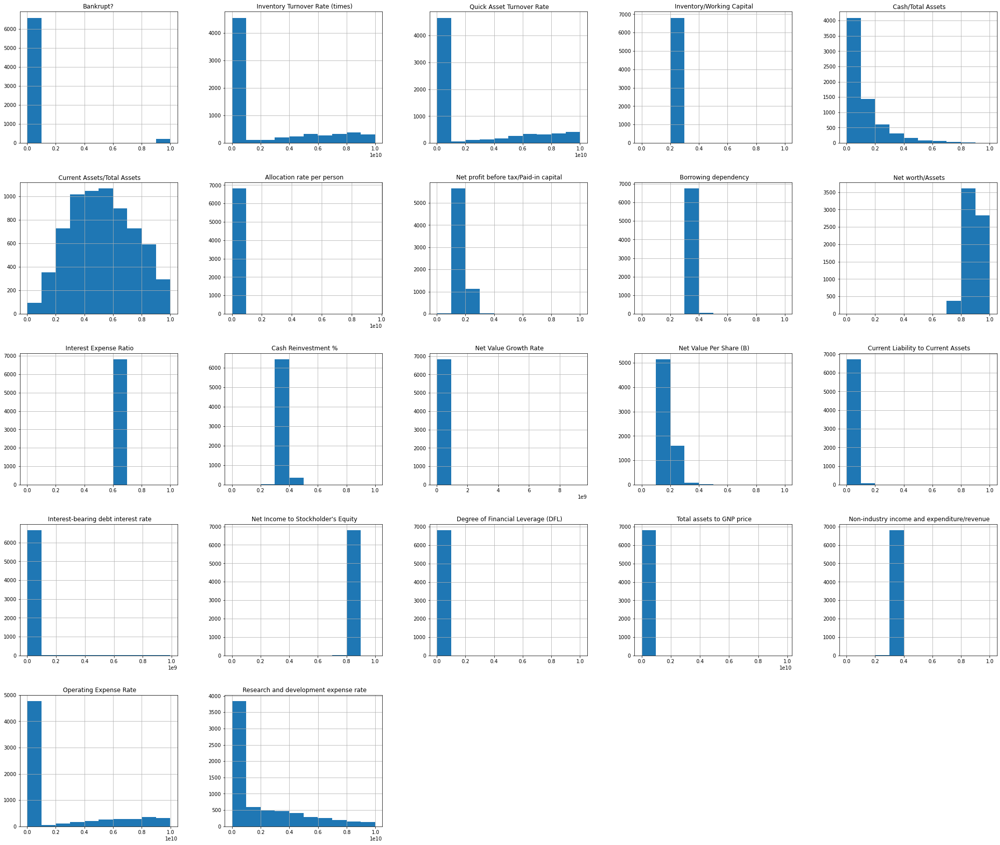

In [7]:
df.hist(bins=10, figsize=(35,30))
plt.show()

In [8]:
#split dataset in features and target variable
X = df.iloc[:, 1:]
X

,Inventory Turnover Rate (times),Quick Asset Turnover Rate,Inventory/Working Capital,Cash/Total Assets,Current Assets/Total Assets,Allocation rate per person,Net profit before tax/Paid-in capital,Borrowing dependency,Net worth/Assets,Interest Expense Ratio,...,Net Value Growth Rate,Net Value Per Share (B),Current Liability to Current Assets,Interest-bearing debt interest rate,Net Income to Stockholder's Equity,Degree of Financial Leverage (DFL),Total assets to GNP price,Non-industry income and expenditure/revenue,Operating Expense Rate,Research and development expense rate
0,1.820926e-04,6.550000e+09,0.276920,0.004094,0.190643,0.037135,0.137757,0.390284,0.792424,0.629951,...,0.000327,0.147950,0.118250,7.250725e-04,0.827890,0.026601,0.009219,0.302646,1.256969e-04,0.000000e+00
1,9.360000e+09,7.700000e+09,0.289642,0.014948,0.182419,0.012335,0.168962,0.376760,0.828824,0.635172,...,0.000443,0.182251,0.047775,6.470647e-04,0.839969,0.264577,0.008323,0.303556,2.897851e-04,0.000000e+00
2,6.500000e+07,1.022676e-03,0.277456,0.000991,0.602806,0.141016,0.148036,0.379093,0.792484,0.629631,...,0.000396,0.177911,0.025346,7.900790e-04,0.836774,0.026555,0.040003,0.302035,2.361297e-04,2.550000e+07
3,7.130000e+09,6.050000e+09,0.276580,0.018851,0.225815,0.021320,0.147561,0.379743,0.848535,0.630228,...,0.000382,0.154187,0.067250,4.490449e-04,0.834697,0.026697,0.003252,0.303350,1.078888e-04,0.000000e+00
4,1.633674e-04,5.050000e+09,0.287913,0.014161,0.358380,0.023988,0.167461,0.375025,0.893491,0.636055,...,0.000439,0.167502,0.047725,6.860686e-04,0.839973,0.024752,0.003878,0.303475,7.890000e+09,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6814,4.030000e+07,1.244230e-04,0.277543,0.099481,0.578455,0.006312,0.171111,0.373823,0.875382,0.631415,...,0.000450,0.175045,0.027951,1.790179e-04,0.840359,0.027064,0.000466,0.303510,1.510213e-04,4.500000e+09
6815,9.940000e+09,1.173396e-04,0.277368,0.080337,0.444043,0.003401,0.171805,0.372505,0.900747,0.631489,...,0.000445,0.181324,0.031470,2.370237e-04,0.840306,0.027009,0.001959,0.303520,5.220000e+09,1.440000e+09
6816,2.797309e-04,1.749713e-04,0.277022,0.412885,0.496053,0.002774,0.172287,0.369637,0.961061,0.630612,...,0.000435,0.269521,0.007542,0.000000e+00,0.840138,0.026791,0.002840,0.303512,2.509312e-04,1.039086e-04
6817,4.550000e+09,1.351937e-04,0.277353,0.112238,0.564439,0.007489,0.182498,0.369649,0.913021,0.630731,...,0.000529,0.213392,0.022916,2.110211e-04,0.841084,0.026822,0.002837,0.303498,1.236154e-04,2.510000e+09


In [9]:
y = df.iloc[:, 0]
y

0       1
1       1
2       1
3       1
4       1
       ..
6814    0
6815    0
6816    0
6817    0
6818    0
Name: Bankrupt?, Length: 6819, dtype: int64

In [10]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42) # 66% training and 34% test
print(X_train.shape, X_test.shape, y_train, y_test.shape)

(4773, 21) (2046, 21) 5632    0
903     0
2666    0
109     0
5316    0
       ..
3772    0
5191    0
5226    0
5390    0
860     0
Name: Bankrupt?, Length: 4773, dtype: int64 (2046,)


In [11]:
print(Counter(y_train))
print(f"         0: {Counter(y_train)[0]/len(y_train):.0%},  1: {Counter(y_train)[1]/len(y_train):.0%}")

Counter({0: 4631, 1: 142})
         0: 97%,  1: 3%


At this point, we create a Decision Tree classifier, applying the default parameters to train and predict our model. The default parameters for CART algorithm can be found here: https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html#sklearn.tree.DecisionTreeClassifier  

In [12]:
# Create standard Decision Tree classifer object
DT_clf = DecisionTreeClassifier(max_depth=None)

# Train Decision Tree Classifer
DT_clf = DT_clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = DT_clf.predict(X_test)

**SMOTE - Synthetic Minority Over-sampling Technique**

What is SMOTE? SMOTE (Synthetic Minority Oversampling Technique) works by randomly picking a point from the minority class and computing the k-nearest neighbors for this point. The synthetic points are added between the chosen point and its neighbors.https://www.analyticsvidhya.com/blog/2020/07/10-techniques-to-deal-with-class-imbalance-in-machine-learning/

We apply the SMOTE technique of handling imbalance to help us improve the performance of the model.

In [13]:
from imblearn.over_sampling import SMOTE
smote = SMOTE(sampling_strategy='auto', k_neighbors=5, random_state=42)

X_smote, y_smote = smote.fit_resample(X,y)

In [14]:
# Split dataset into training set and test set
X_smote_train, X_smote_test, y_smote_train, y_smote_test = train_test_split(X_smote, y_smote, test_size=0.30, random_state=42) # 66% training and 34% test

In [15]:
from collections import Counter
print("Before SMOTE :" , Counter(y_train))
print(f"                        0: {Counter(y_train)[0]/len(y_train):.0%},  1: {Counter(y_train)[1]/len(y_train):.0%}")
print("After SMOTE :" , Counter(y_smote_train))
print(f"                        0: {Counter(y_smote_train)[0]/len(y_smote_train):.0%},  1: {Counter(y_smote_train)[1]/len(y_smote_train):.0%}")

Before SMOTE : Counter({0: 4631, 1: 142})
                        0: 97%,  1: 3%
After SMOTE : Counter({1: 4644, 0: 4594})
                        0: 50%,  1: 50%


In [16]:
# Create standard Decision Tree classifer object
DT_clf_SMOTE = DecisionTreeClassifier(max_depth=None)

# Train Decision Tree Classifer with SMOTE
DT_clf_SMOTE = DT_clf_SMOTE.fit(X_smote_train, y_smote_train)

#Predict the response for test dataset
y_pred_SMOTE = DT_clf_SMOTE.predict(X_smote_test)

In [17]:
print("Predicted values:") 
y_pred.shape

Predicted values:


(2046,)

In [18]:
# SMOTE
print("Predicted values:") 
y_pred_SMOTE.shape

Predicted values:


(3960,)

__Evaluation of the model__

In [19]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred)*100,"%")

Accuracy: 94.6236559139785 %


In [20]:
# SMOTE
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_smote_test, y_pred_SMOTE)*100,"%")

Accuracy: 95.15151515151516 %


In [21]:
MAE = round(metrics.mean_absolute_error(y_test, y_pred),3)
print('Mean Absolute Error:',MAE)

Mean Absolute Error: 0.054


In [22]:
# SMOTE
MAE = round(metrics.mean_absolute_error(y_smote_test, y_pred_SMOTE),3)
print('Mean Absolute Error:',MAE)

Mean Absolute Error: 0.048


The Receiver Operating Characteristic (ROC) curve is a standard technique for
summarizing classifier performance over a range of tradeoffs between true positive and false
positive error rates (Swets, 1988).

The Area Under the Curve (AUC) is an accepted traditional performance metric for a ROC curve (Duda, Hart, & Stork, 2001; Bradley, 1997; Lee,
2000). The ROC convex hull can also be used as a robust method of identifying potentially
optimal classifiers (Provost & Fawcett, 2001). If a line passes through a point on the convex
hull, then there is no other line with the same slope passing through another point with a
larger true positive (TP) intercept. Thus, the classifier at that point is optimal under any
distribution assumptions in tandem with that slope.

In [23]:
fpr, tpr, thresh = metrics.roc_curve(y_test, y_pred)
auc = metrics.auc(fpr, tpr)
print("Area Under ROC curve is :", auc)

Area Under ROC curve is : 0.645774702939337


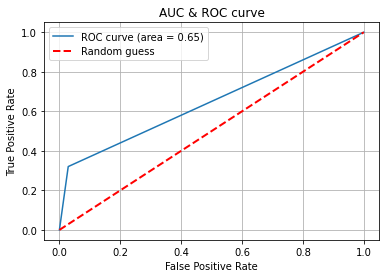

In [24]:
plt.plot(fpr, tpr, label='ROC curve (area = %.2f)' %auc)
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Random guess')
plt.title('AUC & ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid()
plt.legend()
plt.show()

In [25]:
# SMOTE
fpr_S, tpr_S, thresh_S = metrics.roc_curve(y_smote_test, y_pred_SMOTE)
auc = metrics.auc(fpr_S, tpr_S)
print("Area Under ROC curve is :", auc)

Area Under ROC curve is : 0.9517178919708402


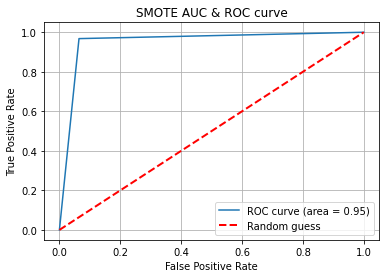

In [26]:
plt.plot(fpr_S, tpr_S, label='ROC curve (area = %.2f)' %auc)
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Random guess')
plt.title('SMOTE AUC & ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid()
plt.legend()
plt.show()

The Mean Squared Error (MSE) is a measure of how close a fitted line is to data points. For every data point, you take the distance vertically from the point to the corresponding y value on the curve fit (the error), and square the value. Then you add up all those values for all data points, and, in the case of a fit with two parameters such as a linear fit, divide by the number of points minus two.** The squaring is done so negative values do not cancel positive values. The smaller the Mean Squared Error, the closer the fit is to the data. The MSE has the units squared of whatever is plotted on the vertical axis.

Another quantity that we calculate is the Root Mean Squared Error (RMSE). It is just the square root of the mean square error. That is probably the most easily interpreted statistic, since it has the same units as the quantity plotted on the vertical axis.

Key point: The RMSE is thus the distance, on average, of a data point from the fitted line, measured along a vertical line.

The RMSE is directly interpretable in terms of measurement units, and so is a better measure of goodness of fit than a correlation coefficient. One can compare the RMSE to observed variation in measurements of a typical point. The two should be similar for a reasonable fit.

In [27]:
MSE = round(metrics.mean_squared_error(y_test, y_pred),5)
print("Mean Squared Error :",MSE)

Mean Squared Error : 0.05376


In [28]:
#SMOTE
MSE_S = round(metrics.mean_squared_error(y_smote_test, y_pred_SMOTE),3)
print("Mean Squared Error :",MSE)

Mean Squared Error : 0.05376


In [29]:
RMSE = round(np.sqrt(MSE),3)
print("Root Mean Squared Error :", RMSE)

Root Mean Squared Error : 0.232


In [30]:
#Smote
RMSE = round(np.sqrt(MSE_S),3)
print("Root Mean Squared Error :", RMSE)

Root Mean Squared Error : 0.219


In [31]:
# Confusion matrix to evaluate the performance of decision tree
pd.DataFrame(metrics.confusion_matrix(y_test, y_pred),
    columns=['Predicated_Not_bankrupt', 'Predicated_Bankrupt'],
    index=['Actual_Not bankrupt', 'Actual_Bankrupt']) 

,Predicated_Not_bankrupt,Predicated_Bankrupt
Actual_Not bankrupt,1911,57
Actual_Bankrupt,53,25


__From the confusion matrix, you can see that out of 2046 test instances, our algorithm misclassified only 114. This is 94 % accuracy__

In [32]:
print("Report:",metrics.classification_report(y_test, y_pred))

Report:               precision    recall  f1-score   support

           0       0.97      0.97      0.97      1968
           1       0.30      0.32      0.31        78

    accuracy                           0.95      2046
   macro avg       0.64      0.65      0.64      2046
weighted avg       0.95      0.95      0.95      2046



In [33]:
#SMOTE
# Confusion matrix to evaluate the performance of decision tree
pd.DataFrame(metrics.confusion_matrix(y_smote_test, y_pred_SMOTE),
    columns=['Predicated_Not_bankrupt', 'Predicated_Bankrupt'],
    index=['Actual_Not bankrupt', 'Actual_Bankrupt']) 

,Predicated_Not_bankrupt,Predicated_Bankrupt
Actual_Not bankrupt,1876,129
Actual_Bankrupt,63,1892


__From the confusion matrix, you can see that out of 3960 test instances, our algorithm misclassified only 183. This is 95 % accuracy__

In [34]:
#SMOTE
print("Report:",metrics.classification_report(y_smote_test, y_pred_SMOTE))

Report:               precision    recall  f1-score   support

           0       0.97      0.94      0.95      2005
           1       0.94      0.97      0.95      1955

    accuracy                           0.95      3960
   macro avg       0.95      0.95      0.95      3960
weighted avg       0.95      0.95      0.95      3960



In __Decision Tree classifiers__, we decide on a split point in the algorithm and calculate some metric ie __entropy__ or __gini impurity__  at a given node for the left and right node after the split. We show the perfomance of the compared trees in terms of accuracy for a define depth for each tree test with gini and entropy aspects.

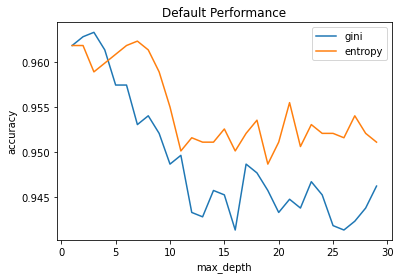

In [35]:
max_depth = []
acc_gini = []
acc_entropy = []
for i in range(1,30):
 dtree = DecisionTreeClassifier(criterion='gini', max_depth=i)
 dtree.fit(X_train, y_train)
 pred = dtree.predict(X_test)
 acc_gini.append(metrics.accuracy_score(y_test, pred))
 ####
 dtree = DecisionTreeClassifier(criterion='entropy', max_depth=i)
 dtree.fit(X_train, y_train)
 pred = dtree.predict(X_test)
 acc_entropy.append(metrics.accuracy_score(y_test, pred))
 ####
 max_depth.append(i)
d = pd.DataFrame({'acc_gini':pd.Series(acc_gini), 
 'acc_entropy':pd.Series(acc_entropy),
 'max_depth':pd.Series(max_depth)})
# visualizing changes in parameters
plt.plot('max_depth','acc_gini', data=d, label='gini')
plt.plot('max_depth','acc_entropy', data=d, label='entropy')
plt.title('Default Performance')
plt.xlabel('max_depth')
plt.ylabel('accuracy')
plt.legend()

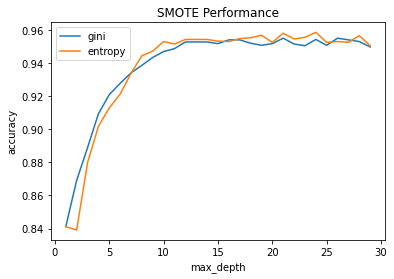

In [36]:
max_depth = []
acc_gini = []
acc_entropy = []
for i in range(1,30):
 dtree = DecisionTreeClassifier(criterion='gini', max_depth=i)
 dtree.fit(X_smote_train, y_smote_train)
 pred = dtree.predict(X_smote_test)
 acc_gini.append(metrics.accuracy_score(y_smote_test, pred))
 ####
 dtree = DecisionTreeClassifier(criterion='entropy', max_depth=i)
 dtree.fit(X_smote_train, y_smote_train)
 pred = dtree.predict(X_smote_test)
 acc_entropy.append(metrics.accuracy_score(y_smote_test, pred))
 ####
 max_depth.append(i)
d = pd.DataFrame({'acc_gini':pd.Series(acc_gini), 
 'acc_entropy':pd.Series(acc_entropy),
 'max_depth':pd.Series(max_depth)})
# visualizing changes in parameters
plt.plot('max_depth','acc_gini', data=d, label='gini')
plt.plot('max_depth','acc_entropy', data=d, label='entropy')
plt.title('SMOTE Performance')
plt.xlabel('max_depth')
plt.ylabel('accuracy')
plt.legend()

__Visualise the Decision Trees__

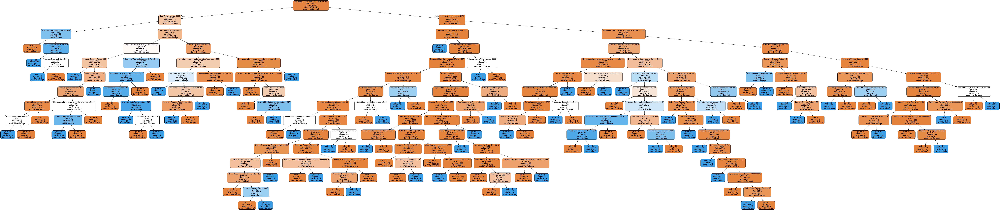

In [37]:
from sklearn.tree import export_graphviz
from six import StringIO  
from IPython.display import Image  
import pydotplus

feature_cols = df.drop(['Bankrupt?'],axis=1)
feature_cols.shape

dot_data = StringIO()
export_graphviz(DT_clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols.columns,class_names=['Not Bankrupt','Bankrupt'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('./data/bankrupt.png')
Image(graph.create_png())

In [38]:
from sklearn.tree import export_graphviz
from six import StringIO  
from IPython.display import Image  
import pydotplus

feature_cols = df.drop(['Bankrupt?'],axis=1)
feature_cols.shape

dot_data = StringIO()
export_graphviz(DT_clf_SMOTE, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols.columns,class_names=['Not Bankrupt','Bankrupt'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('bankrupt.png')
Image(graph.create_png())

__Useful Information concerning the default and weighted trees__

In [39]:
# structure of default tree
clf1 = DT_clf.get_depth()
clf2 = DT_clf.get_n_leaves()

print("Depth of default tree:",clf1)
print("Number of leaves for default tree:",clf2)

Depth of default tree: 14
Number of leaves for default tree: 116


In [40]:
# structure of SMOTE tree
clf3 = DT_clf_SMOTE.get_depth()
clf4 = DT_clf_SMOTE.get_n_leaves()

print("Depth of SMOTE tree::", clf3)
print("Number of leaves for SMOTE tree:",clf4)

Depth of SMOTE tree:: 32
Number of leaves for SMOTE tree: 335


**Problems with imbalanced data in Decision Trees**    
As the classes of our model are strongly imbalanced, the model tends to learn the most common class (class 0 - not bankrupt) and it doesn’t abstract information from the other class.

**Proposed solutions for this premise**   

__*SMOTE*__ : we prefered to use this approach to avoid problems with imbalanced data. According to implementation of DT when handling imbalanced data, SMOTE (Synthetic Minority Oversampling Technique) works by randomly picking a point from the minority class and computing the k-nearest neighbors for this point. The synthetic points are added between the chosen point and its neighbors.https://www.analyticsvidhya.com/blog/2020/07/10-techniques-to-deal-with-class-imbalance-in-machine-learning/

However if we use CV, we fear that the synthetic data may have more of the same class within a single fold and this would bring another problem of overfitting. To handle this, we can use SMOTE with the abillity to randomise in the process of balance the classes for those what will use 10 Fold classification.

**Random Over Sampler**: It is a naive method where the minority class that has low examples is generated and randomly resampled.

__Conclusion__

Although the DT is effective in balanced classifications, it doesnt do well on imbalanced dataset. Since the dataset is imbalanced, one class is dominant and the minority us being ignored, the class proportions are mixed during the splitting proceess. 
So we tried of overcome this imbalance by modifying the dataset used at split points and take into account the importance of each class. We therefore split at 50% and derived a balanced decision tree for this exercise.

In [41]:
#Test accuracy
balanced_accuracy = balanced_accuracy_score(y_smote_test, y_pred_SMOTE)
balanced_accuracy

0.9517178919708402

In [42]:
#Test accuracy
balanced_accuracy_DT = balanced_accuracy_score(y_test, y_pred)
balanced_accuracy_DT

0.6457747029393371

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=41a30818-97d0-4136-9b87-e05a91508403' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>